In [2]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import os 

In [19]:
base_dir = 'CloudDetection/images' 

all_files = os.listdir(base_dir)
if not all_files:
    raise FileNotFoundError("No files found in the specified directory.")

#find first doc
first_image_path = os.path.join(base_dir, all_files[0])

file_in_imagefile = os.listdir(first_image_path)

#find _in doc
radiance_layers = [file for file in file_in_imagefile if 'radiance_in.nc' in file]
quality_layers = [file for file in file_in_imagefile if file.startswith('S') and file.endswith('_quality_in.nc')]

print("Radiance layers:", radiance_layers)
print("Quality layers:", quality_layers)

Radiance layers: ['S1_radiance_in.nc', 'S2_radiance_in.nc', 'S3_radiance_in.nc', 'S4_radiance_in.nc', 'S5_radiance_in.nc', 'S6_radiance_in.nc']
Quality layers: ['S7_quality_in.nc', 'S8_quality_in.nc', 'S9_quality_in.nc']


In [20]:
# 读取并检查所有 radiance_in 文件
radiance_datasets = []
for file in radiance_layers:
    file_path = os.path.join(first_image_path, file)
    ds = xr.open_dataset(file_path)
    radiance_datasets.append(ds)
    print(f"\nFile: {file}")
    print("Dimensions:", ds.dims)
    print("Variables:", list(ds.data_vars.keys()))

# 读取并检查所有 quality_in 文件
quality_datasets = []
for file in quality_layers:
    file_path = os.path.join(first_image_path, file)
    ds = xr.open_dataset(file_path)
    quality_datasets.append(ds)
    print(f"\nFile: {file}")
    print("Dimensions:", ds.dims)
    print("Variables:", list(ds.data_vars.keys()))



File: S1_radiance_in.nc
Dimensions: Frozen({'rows': 1200, 'columns': 1500})
Variables: ['S1_radiance_in']

File: S2_radiance_in.nc
Dimensions: Frozen({'rows': 1200, 'columns': 1500})
Variables: ['S2_radiance_in']

File: S3_radiance_in.nc
Dimensions: Frozen({'rows': 1200, 'columns': 1500})
Variables: ['S3_radiance_in']

File: S4_radiance_in.nc
Dimensions: Frozen({'rows': 1200, 'columns': 1500})
Variables: ['S4_radiance_in']

File: S5_radiance_in.nc
Dimensions: Frozen({'rows': 1200, 'columns': 1500})
Variables: ['S5_radiance_in']

File: S6_radiance_in.nc
Dimensions: Frozen({'rows': 1200, 'columns': 1500})
Variables: ['S6_radiance_in']

File: S7_quality_in.nc
Dimensions: Frozen({'rows': 1200, 'detectors': 2, 'integrators': 2, 'one': 1, 'uncertainties': 161})
Variables: ['S7_BB1_reference_1_in', 'S7_BB1_reference_2_in', 'S7_BB2_reference_1_in', 'S7_BB2_reference_2_in', 'S7_BBEU_5VRef_in', 'S7_BBEU_Bridge_Ref_in', 'S7_BBEU_ground_in', 'S7_FEE_offset_in', 'S7_FEE_oversampling_factor_in', 'S

In [28]:
combined_ds = xr.merge(radiance_datasets)
print("Combined Dataset Variables:", list(combined_ds.data_vars.keys()))


Combined Dataset Variables: ['S1_radiance_in', 'S2_radiance_in', 'S3_radiance_in', 'S4_radiance_in', 'S5_radiance_in', 'S6_radiance_in']


In [29]:
# extract all radiance layers
radiance_layers = [key for key in combined_ds.data_vars.keys() if 'radiance_in' in key]

# extract dim 
rows, cols = combined_ds.sizes['rows'], combined_ds.sizes['columns']

num_layers = len(radiance_layers)
all_features = np.zeros((rows, cols, num_layers), dtype=np.float32)

for i, layer in enumerate(radiance_layers):
    # extract data
    data = combined_ds[layer].values

    # datashape
    print(f"Layer {layer} data shape: {data.shape}")

    #use 0 inplace nah
    if np.isnan(data).any() or np.isinf(data).any():
        print(f"Data in layer {layer} contains NaN or Inf values. Replacing with 0.")
        data = np.nan_to_num(data, nan=0.0, posinf=0.0, neginf=0.0)

    std = np.std(data)
    
    if std == 0:
        print(f"Standard deviation is zero for layer {layer}. Skipping standardization and normalization.")
        data_normalized = data  
    else:
        # standardize
        data_standardized = (data - np.mean(data)) / std

        # normalize
        data_normalized = (data_standardized - np.min(data_standardized)) / (np.max(data_standardized) - np.min(data_standardized))

    all_features[:, :, i] = data_normalized

print(f"\nAll features shape: {all_features.shape}")


Layer S1_radiance_in data shape: (1200, 1500)
Data in layer S1_radiance_in contains NaN or Inf values. Replacing with 0.
Layer S2_radiance_in data shape: (1200, 1500)
Data in layer S2_radiance_in contains NaN or Inf values. Replacing with 0.
Layer S3_radiance_in data shape: (1200, 1500)
Data in layer S3_radiance_in contains NaN or Inf values. Replacing with 0.
Layer S4_radiance_in data shape: (1200, 1500)
Data in layer S4_radiance_in contains NaN or Inf values. Replacing with 0.
Layer S5_radiance_in data shape: (1200, 1500)
Data in layer S5_radiance_in contains NaN or Inf values. Replacing with 0.
Layer S6_radiance_in data shape: (1200, 1500)
Data in layer S6_radiance_in contains NaN or Inf values. Replacing with 0.

All features shape: (1200, 1500, 6)


In [30]:
# Calculate statistics (mean and standard deviation)
for i, layer in enumerate(radiance_layers):
    layer_data = all_features[:, :, i]
    mean_value = np.mean(layer_data)
    std_value = np.std(layer_data)
    print(f"Layer {layer}: Mean = {mean_value}, Standard Deviation = {std_value}")



Layer S1_radiance_in: Mean = 0.5335988998413086, Standard Deviation = 0.15584498643875122
Layer S2_radiance_in: Mean = 0.5120728015899658, Standard Deviation = 0.15278702974319458
Layer S3_radiance_in: Mean = 0.49981603026390076, Standard Deviation = 0.14372679591178894
Layer S4_radiance_in: Mean = 0.09561903774738312, Standard Deviation = 0.09857622534036636
Layer S5_radiance_in: Mean = 0.21303944289684296, Standard Deviation = 0.18103229999542236
Layer S6_radiance_in: Mean = 0.26285383105278015, Standard Deviation = 0.17070545256137848


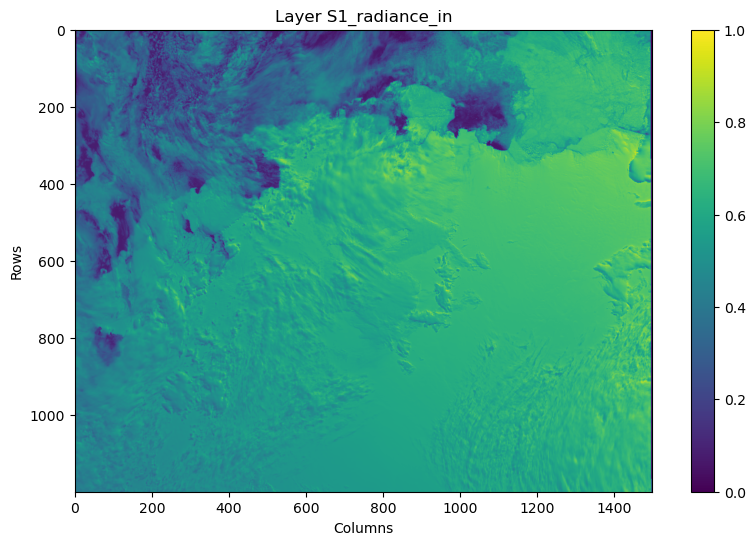

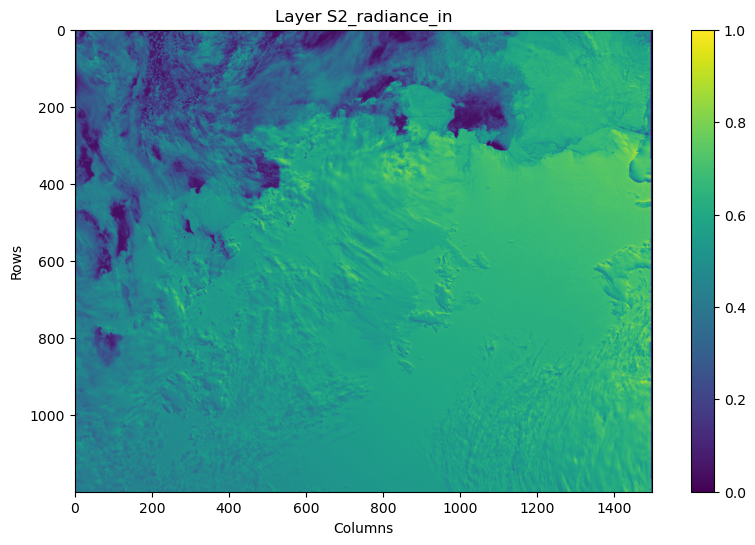

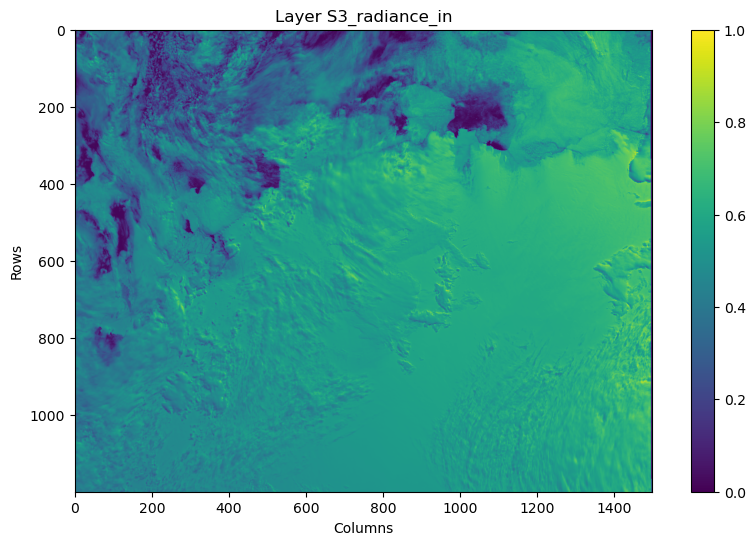

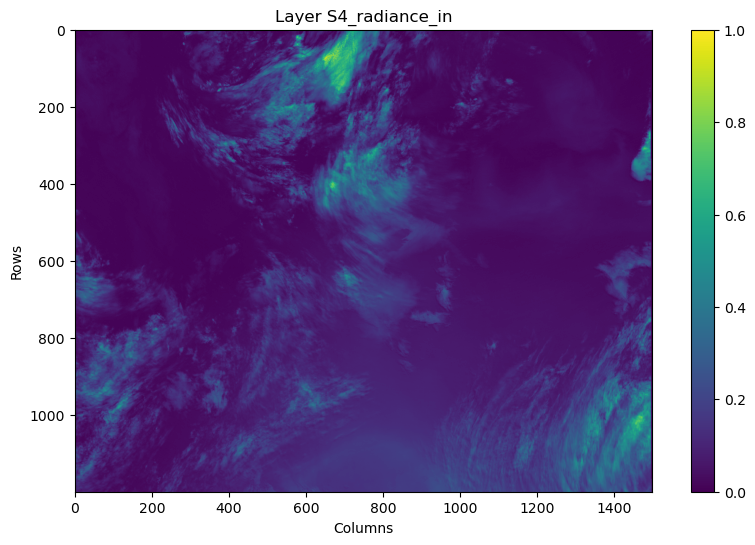

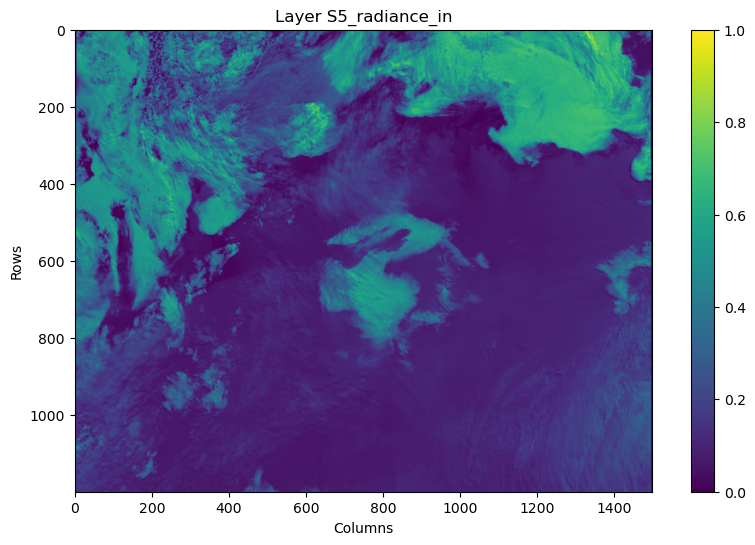

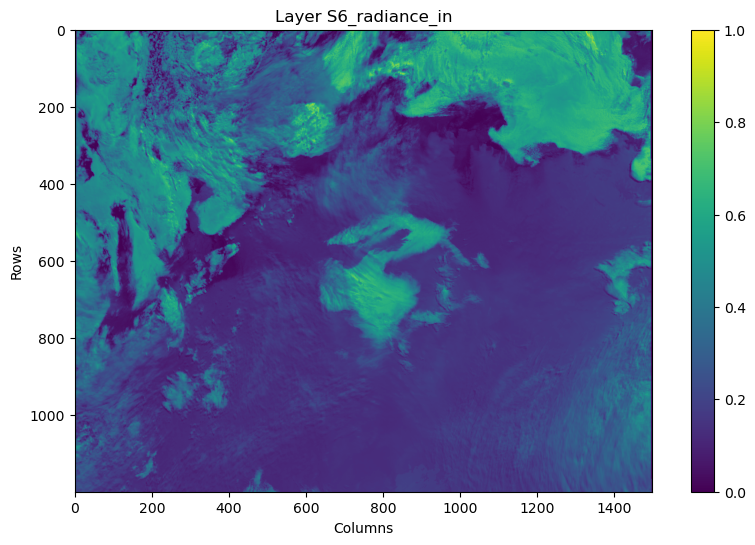

In [31]:
import matplotlib.pyplot as plt

# Visualize data for each layer
for i, layer in enumerate(radiance_layers):
    plt.figure(figsize=(10, 6))
    plt.imshow(all_features[:, :, i], cmap='viridis')
    plt.colorbar()
    plt.title(f"Layer {layer}")
    plt.xlabel('Columns')
    plt.ylabel('Rows')
    plt.show()


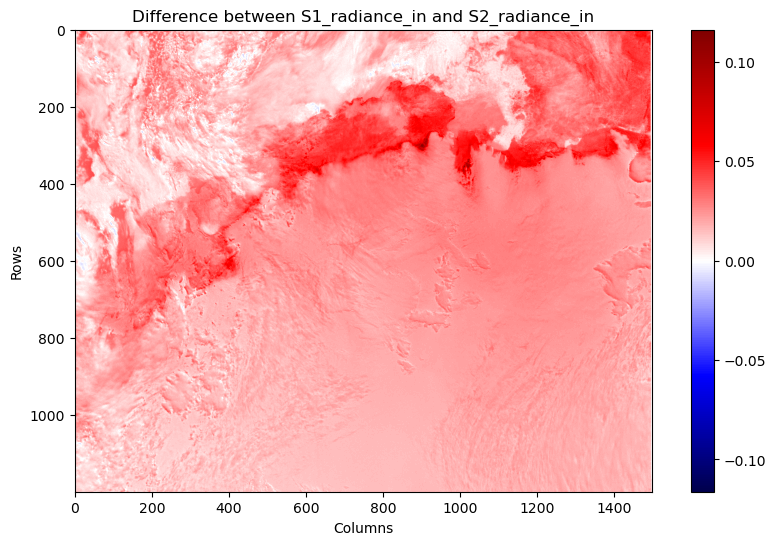

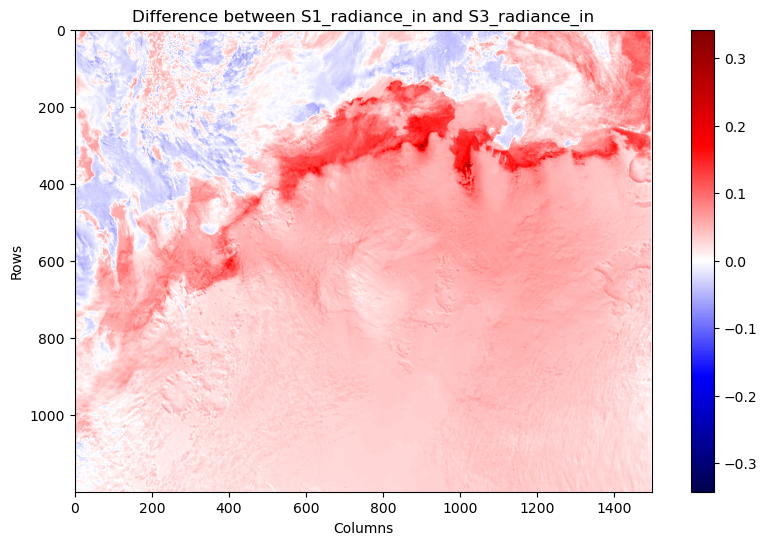

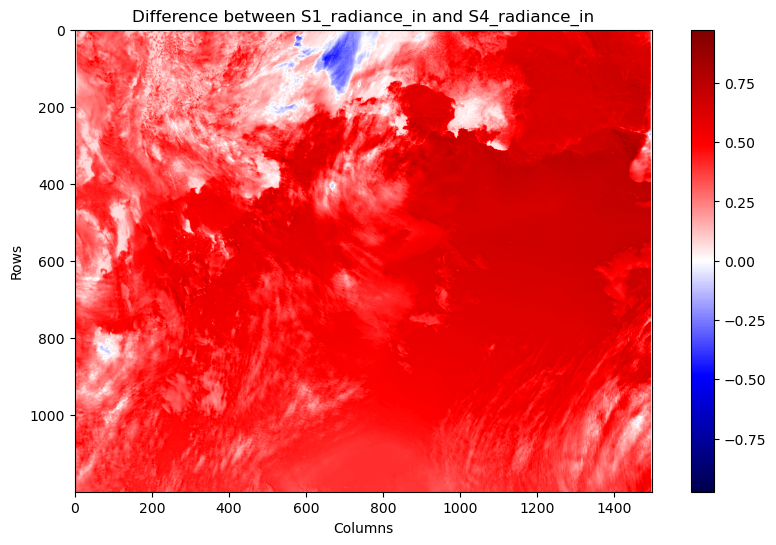

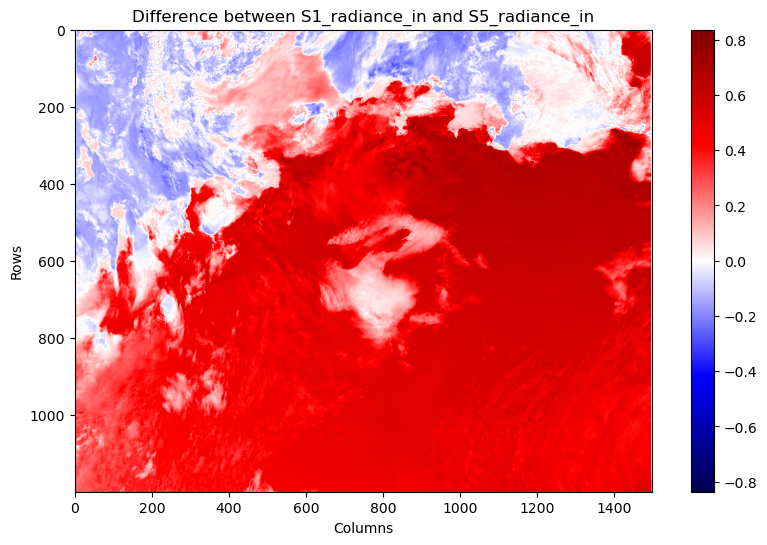

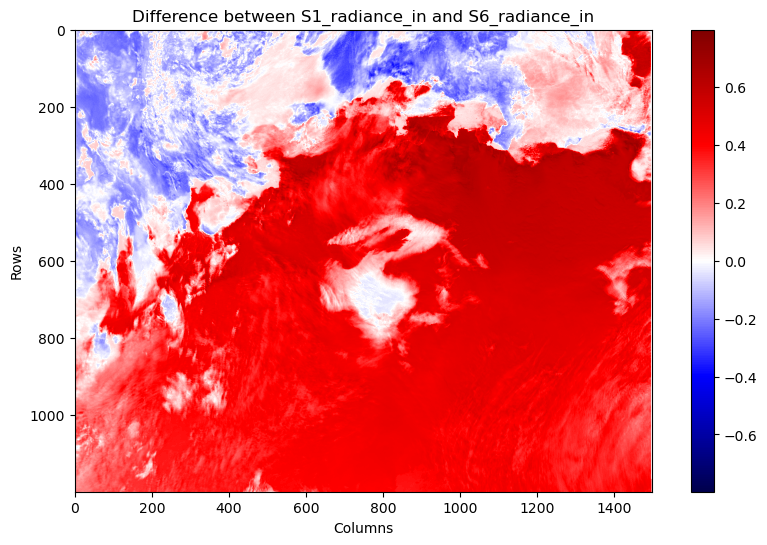

...

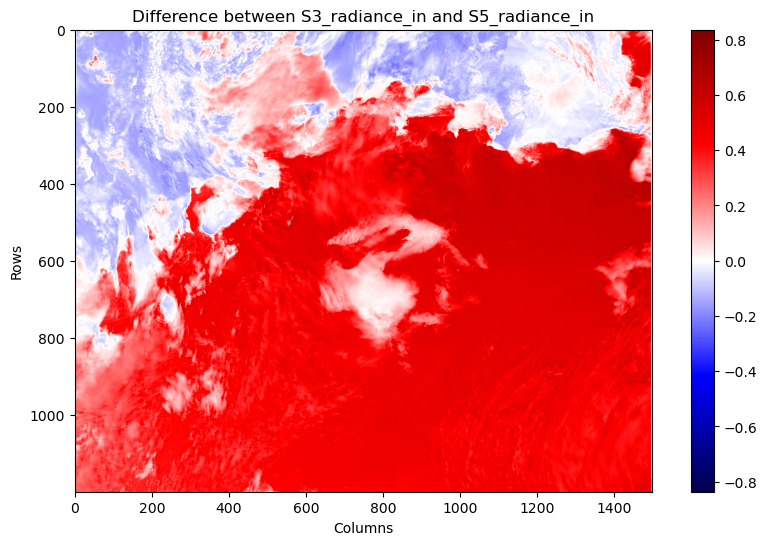

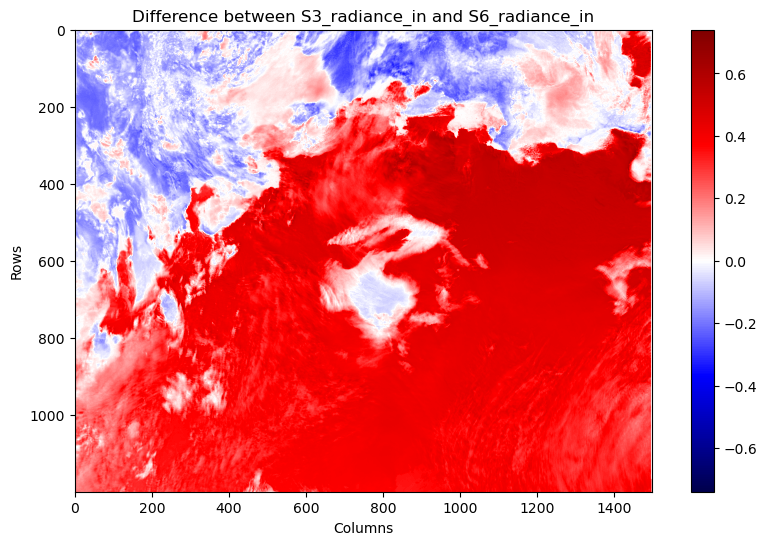

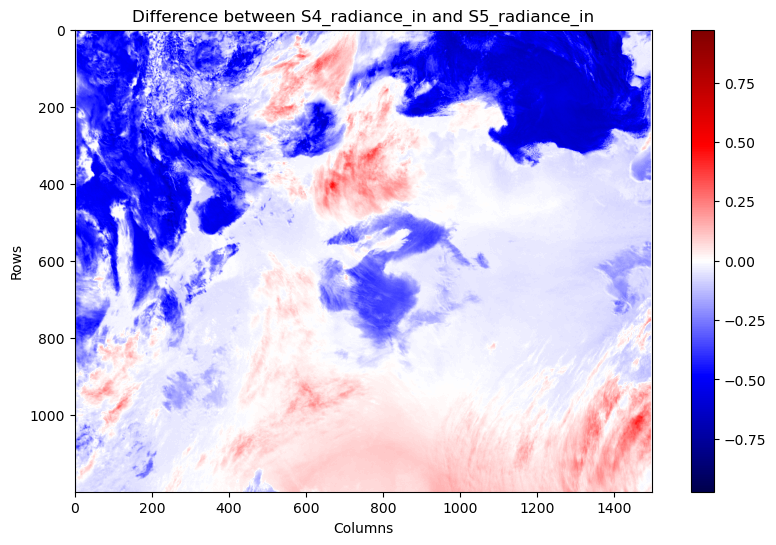

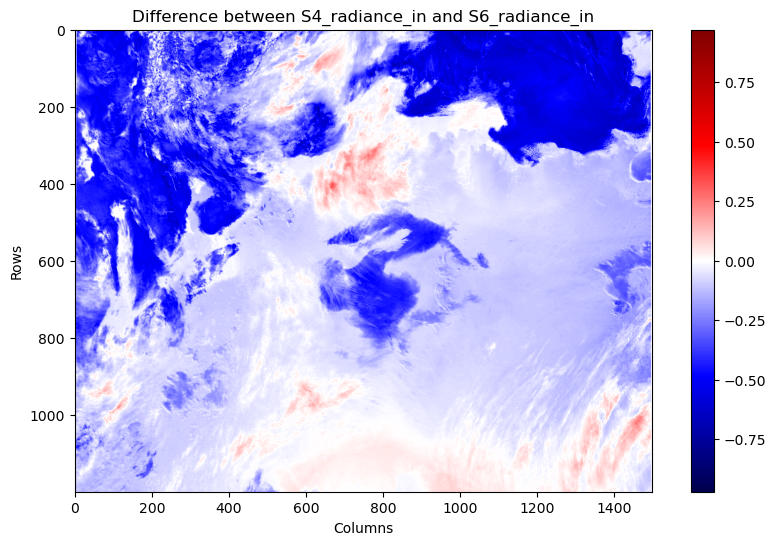

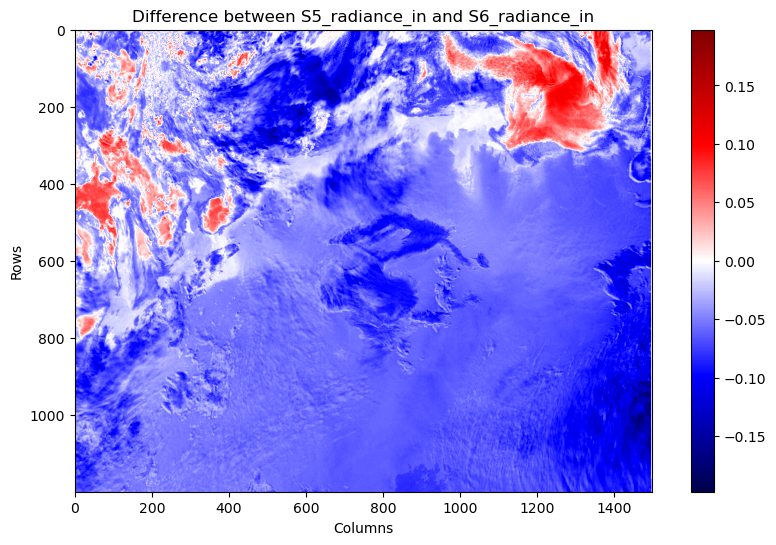

In [32]:
# Calculate and visualize differences between layers
for i in range(num_layers - 1):
    for j in range(i + 1, num_layers):
        diff = all_features[:, :, i] - all_features[:, :, j]
        plt.figure(figsize=(10, 6))
        plt.imshow(diff, cmap='seismic', vmin=-np.max(np.abs(diff)), vmax=np.max(np.abs(diff)))
        plt.colorbar()
        plt.title(f"Difference between {radiance_layers[i]} and {radiance_layers[j]}")
        plt.xlabel('Columns')
        plt.ylabel('Rows')
        plt.show()

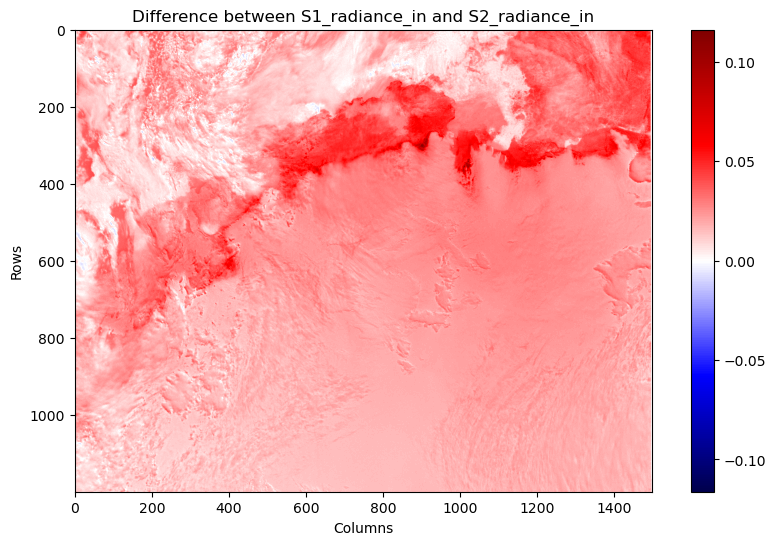

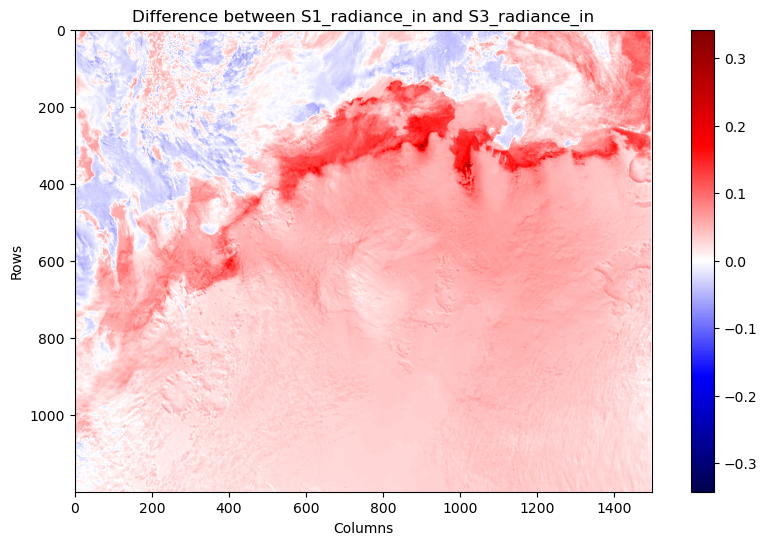

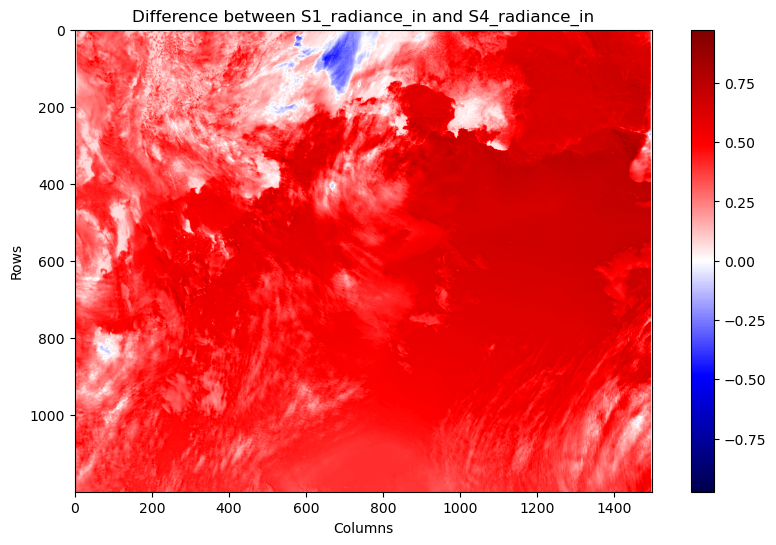

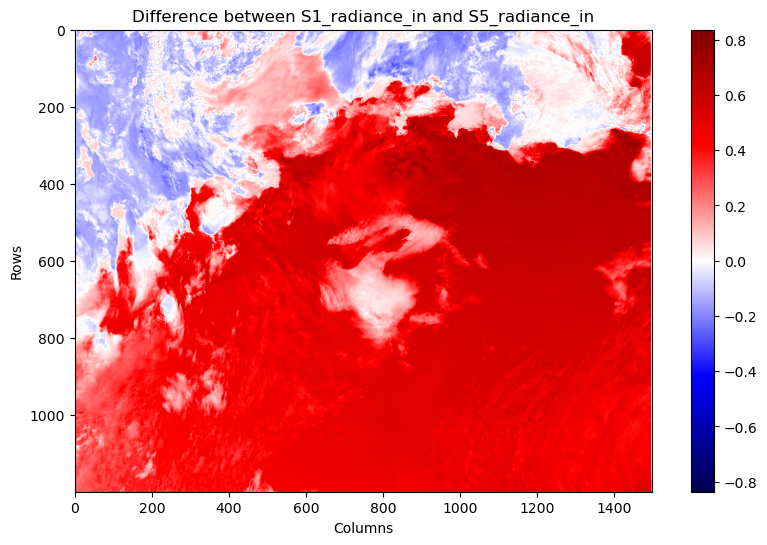

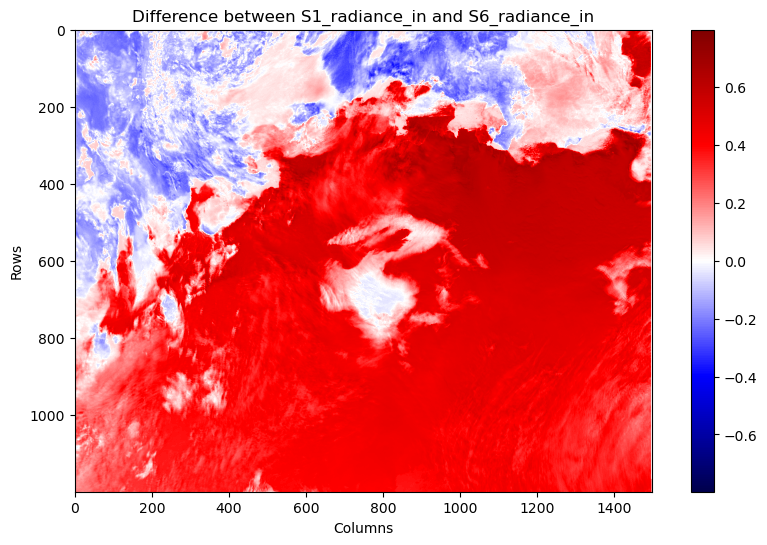

...

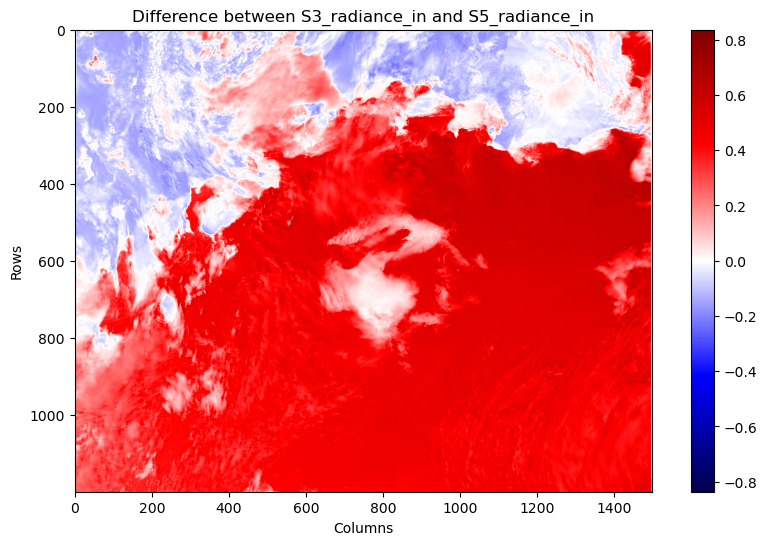

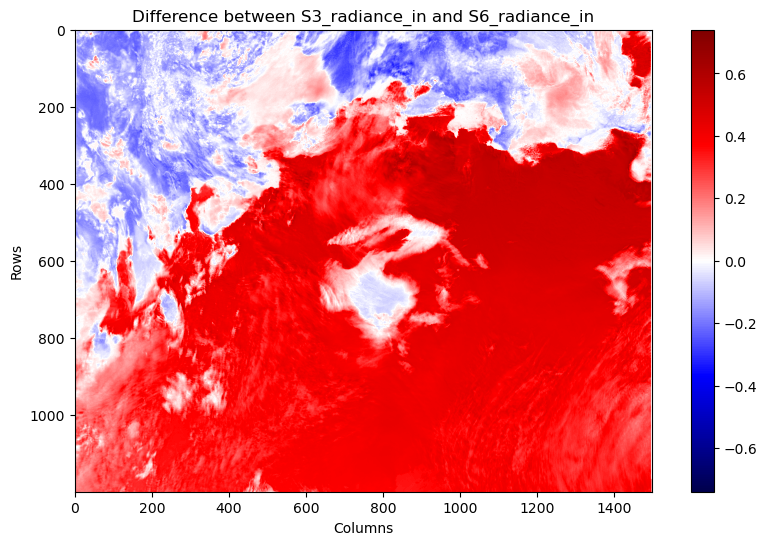

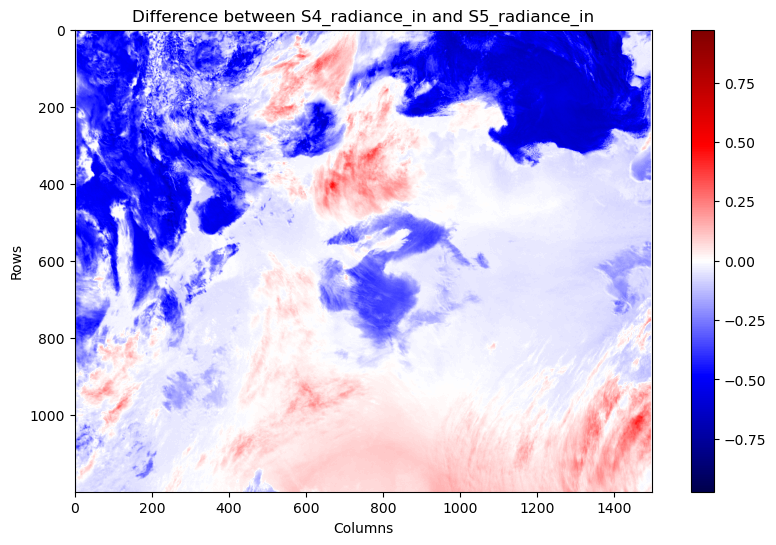

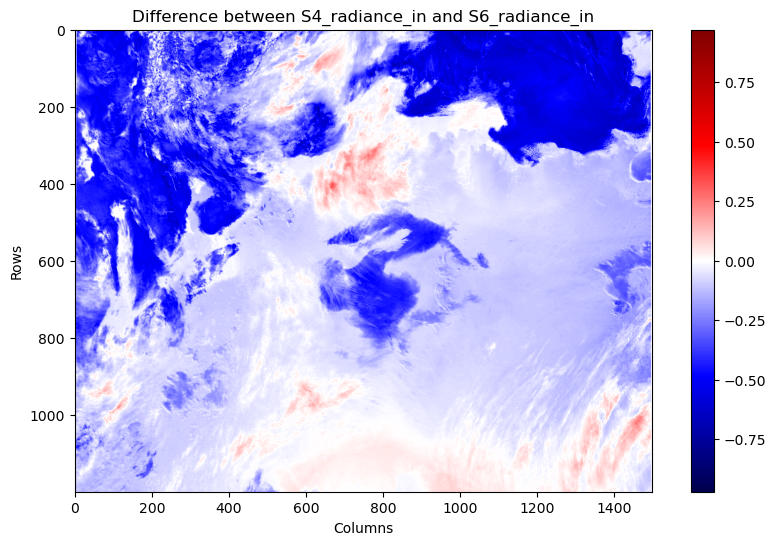

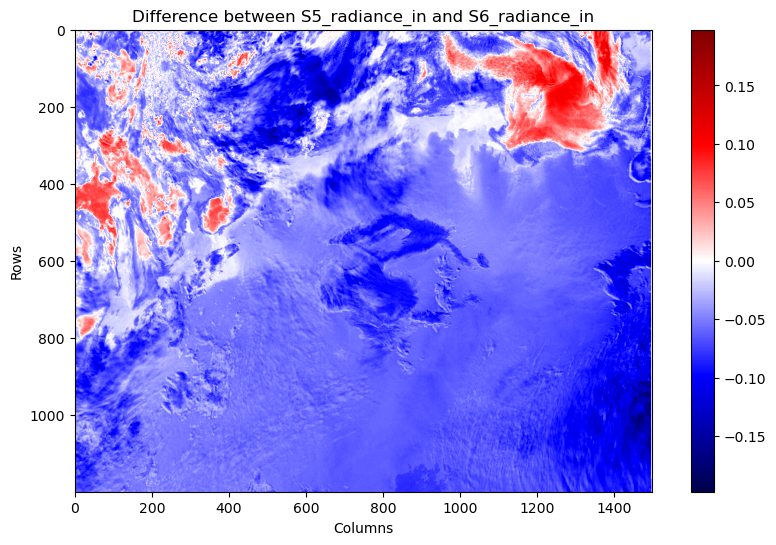

In [33]:
# Calculate and visualize differences between layers
for i in range(num_layers - 1):
    for j in range(i + 1, num_layers):
        diff = all_features[:, :, i] - all_features[:, :, j]
        plt.figure(figsize=(10, 6))
        plt.imshow(diff, cmap='seismic', vmin=-np.max(np.abs(diff)), vmax=np.max(np.abs(diff)))
        plt.colorbar()
        plt.title(f"Difference between {radiance_layers[i]} and {radiance_layers[j]}")
        plt.xlabel('Columns')
        plt.ylabel('Rows')
        plt.show()


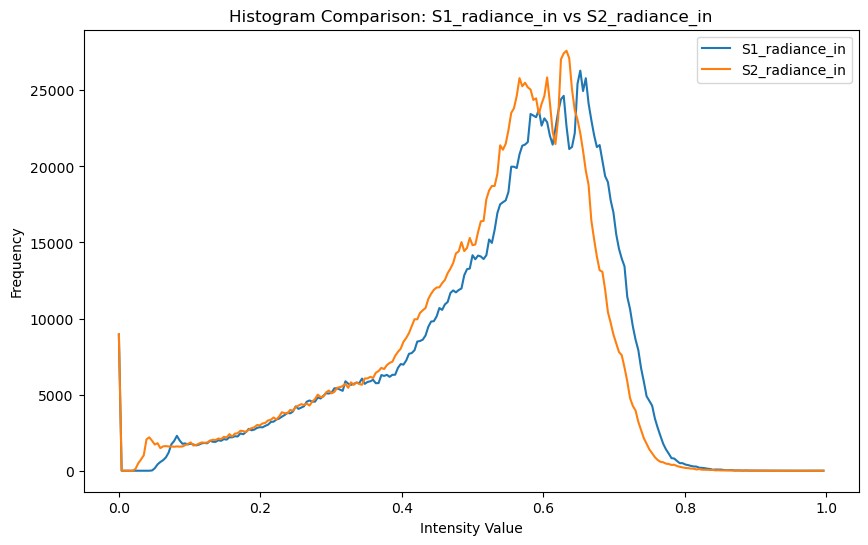

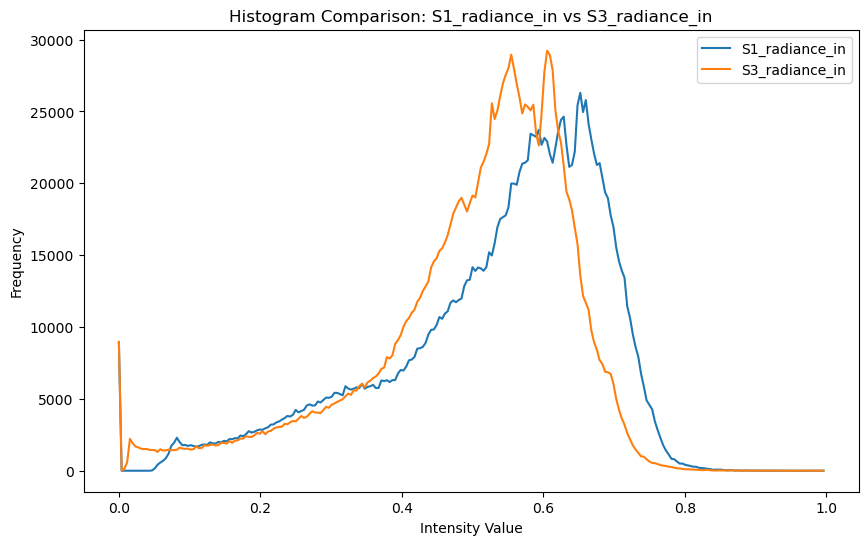

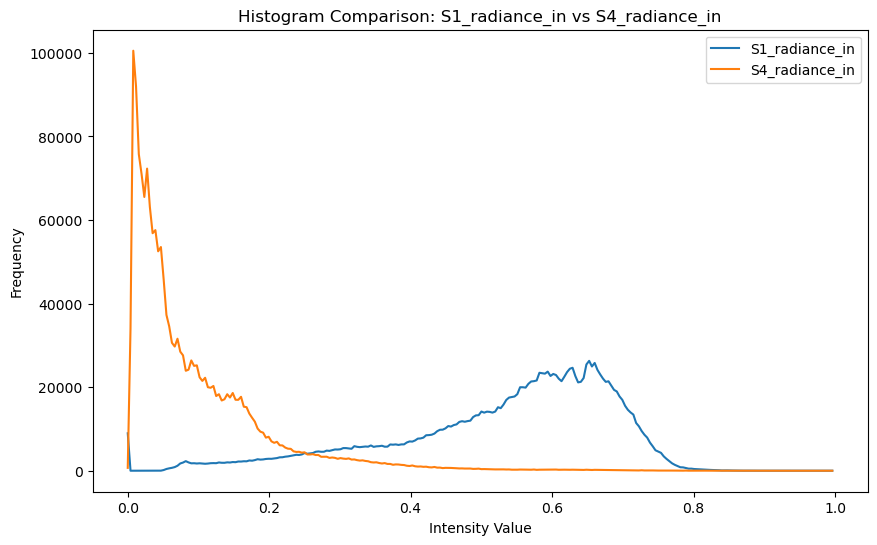

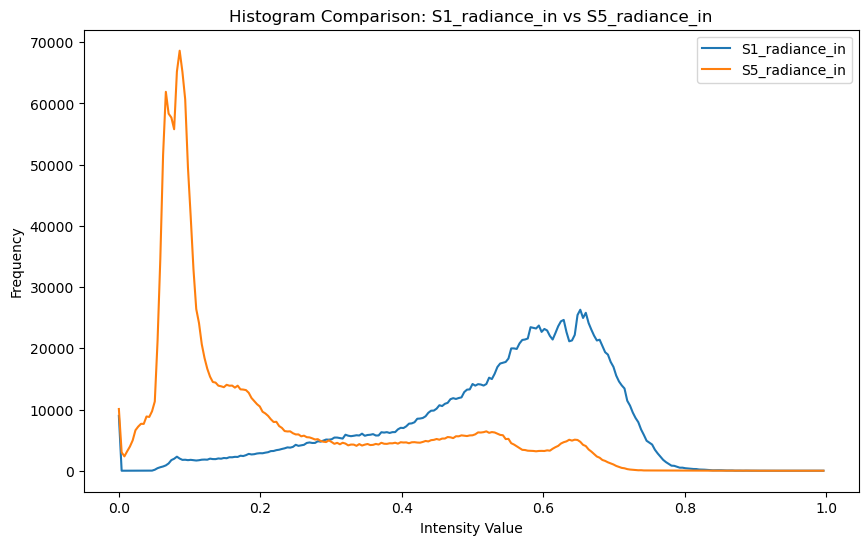

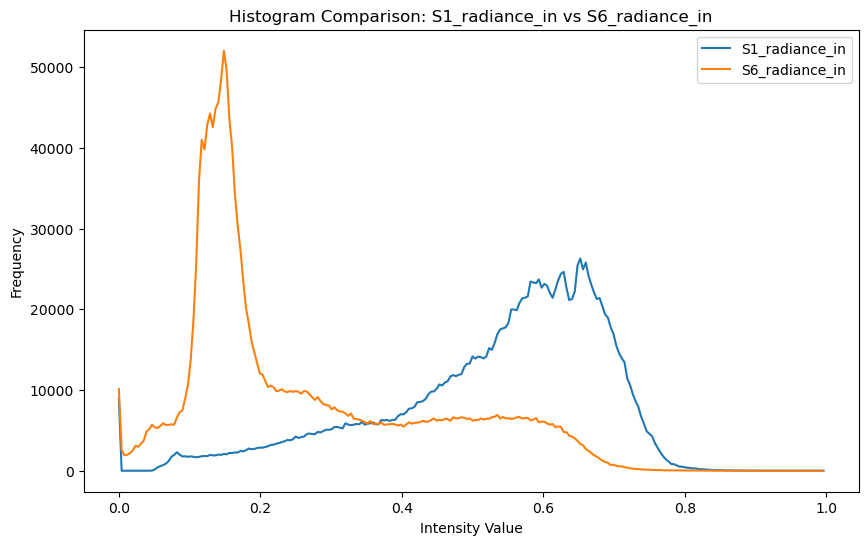

...

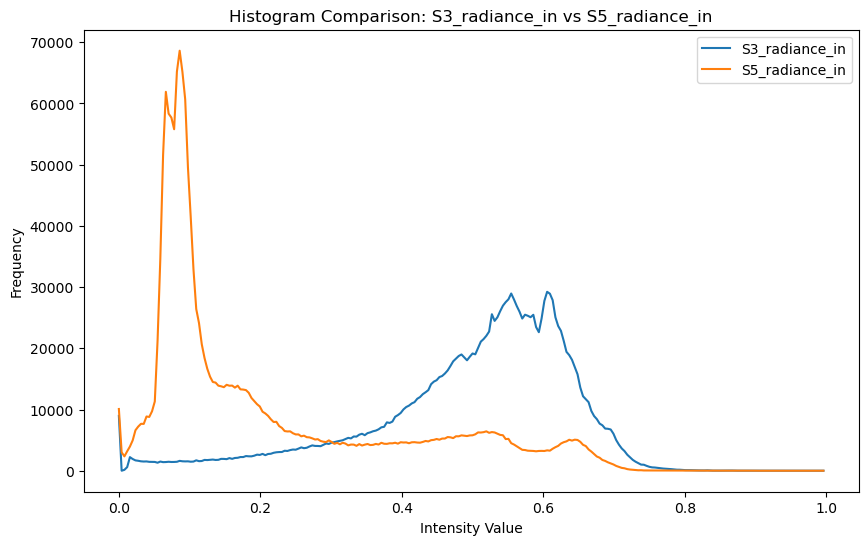

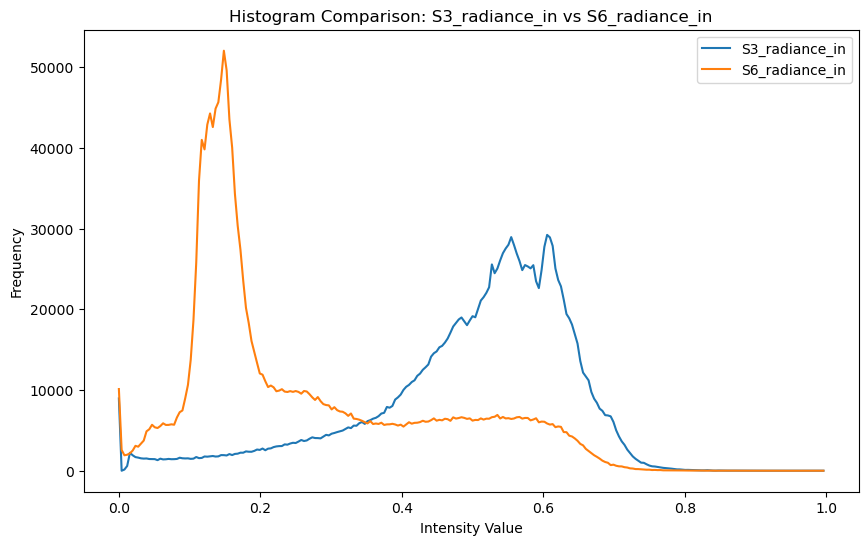

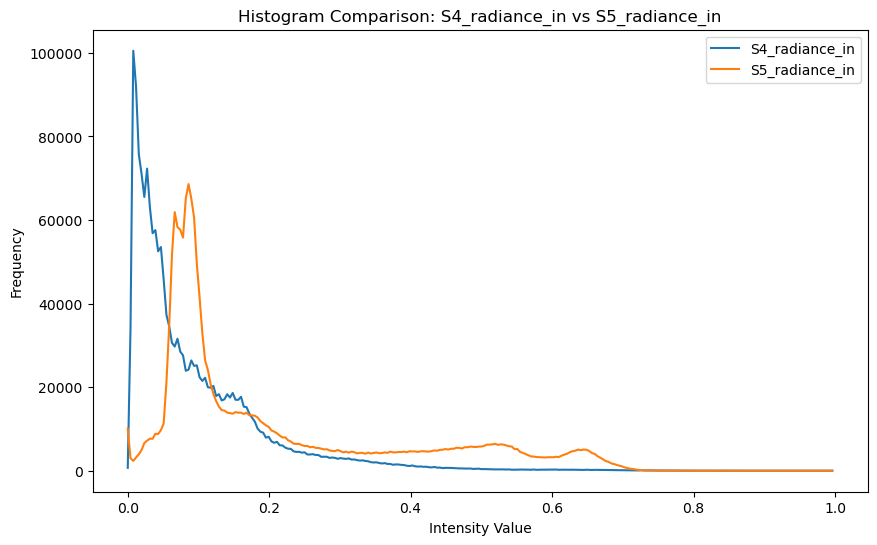

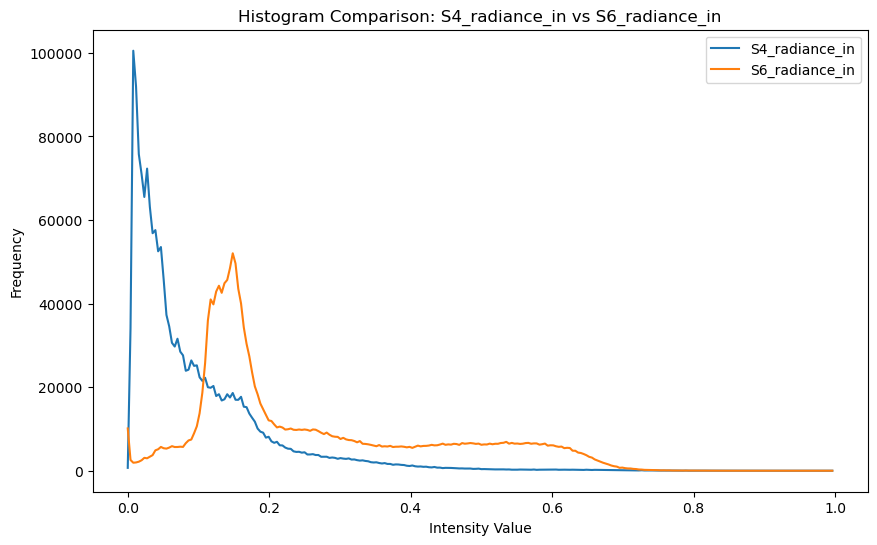

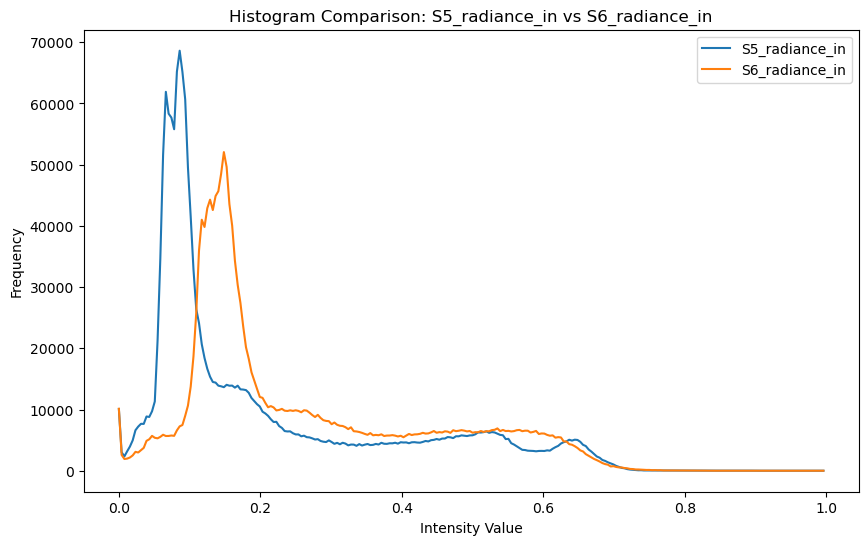

In [34]:
# Compare histograms of different layers
for i in range(num_layers - 1):
    for j in range(i + 1, num_layers):
        hist1, bins1 = np.histogram(all_features[:, :, i].flatten(), bins=256, range=(0, 1))
        hist2, bins2 = np.histogram(all_features[:, :, j].flatten(), bins=256, range=(0, 1))
        
        plt.figure(figsize=(10, 6))
        plt.plot(bins1[:-1], hist1, label=f'{radiance_layers[i]}')
        plt.plot(bins2[:-1], hist2, label=f'{radiance_layers[j]}')
        plt.legend()
        plt.title(f'Histogram Comparison: {radiance_layers[i]} vs {radiance_layers[j]}')
        plt.xlabel('Intensity Value')
        plt.ylabel('Frequency')
        plt.show()


In [37]:
from skimage.metrics import structural_similarity as ssim

# Compare SSIM between different layers
for i in range(num_layers - 1):
    for j in range(i + 1, num_layers):
        ssim_index, _ = ssim(all_features[:, :, i], all_features[:, :, j], data_range=1.0, full=True)
        print(f'SSIM between {radiance_layers[i]} and {radiance_layers[j]}: {ssim_index}')


SSIM between S1_radiance_in and S2_radiance_in: 0.9953487747960753
SSIM between S1_radiance_in and S3_radiance_in: 0.9768050466346548
SSIM between S1_radiance_in and S4_radiance_in: 0.22288830902927653
SSIM between S1_radiance_in and S5_radiance_in: 0.431148434832967
SSIM between S1_radiance_in and S6_radiance_in: 0.5163026441595608
SSIM between S2_radiance_in and S3_radiance_in: 0.9901675997800231
SSIM between S2_radiance_in and S4_radiance_in: 0.2285376736675039
SSIM between S2_radiance_in and S5_radiance_in: 0.4439028820183314
SSIM between S2_radiance_in and S6_radiance_in: 0.5292437649122611
SSIM between S3_radiance_in and S4_radiance_in: 0.23416899531488392
SSIM between S3_radiance_in and S5_radiance_in: 0.4683989573452676
SSIM between S3_radiance_in and S6_radiance_in: 0.5551778469112166
SSIM between S4_radiance_in and S5_radiance_in: 0.5675051622680745
SSIM between S4_radiance_in and S6_radiance_in: 0.5104333231861693
SSIM between S5_radiance_in and S6_radiance_in: 0.90783870384

In [36]:
# Calculate MSE between different layers
for i in range(num_layers - 1):
    for j in range(i + 1, num_layers):
        mse = np.mean((all_features[:, :, i] - all_features[:, :, j]) ** 2)
        print(f'MSE between {radiance_layers[i]} and {radiance_layers[j]}: {mse}')


MSE between S1_radiance_in and S2_radiance_in: 0.0005664604250341654
MSE between S1_radiance_in and S3_radiance_in: 0.002216213382780552
MSE between S1_radiance_in and S4_radiance_in: 0.22294554114341736
MSE between S1_radiance_in and S5_radiance_in: 0.16752761602401733
MSE between S1_radiance_in and S6_radiance_in: 0.13168053328990936
MSE between S2_radiance_in and S3_radiance_in: 0.0007232057978399098
MSE between S2_radiance_in and S4_radiance_in: 0.20322880148887634
MSE between S2_radiance_in and S5_radiance_in: 0.1526523381471634
MSE between S2_radiance_in and S6_radiance_in: 0.11885125190019608
MSE between S3_radiance_in and S4_radiance_in: 0.19012661278247833
MSE between S3_radiance_in and S5_radiance_in: 0.13765664398670197
MSE between S3_radiance_in and S6_radiance_in: 0.10535033792257309
MSE between S4_radiance_in and S5_radiance_in: 0.05712844803929329
MSE between S4_radiance_in and S6_radiance_in: 0.06362759321928024
MSE between S5_radiance_in and S6_radiance_in: 0.003880746

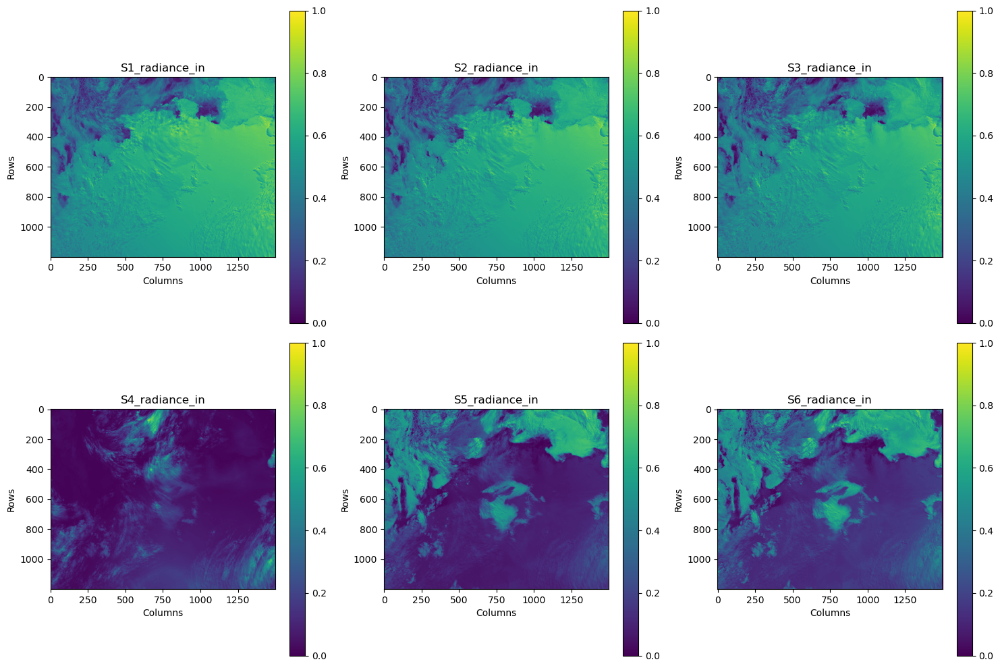

In [40]:
# Number of rows and columns for the subplots
num_rows = 2
num_cols = 3

# Create a figure with subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))

# Flatten the axes array for easy iteration
axes = axes.flatten()
t
for i, layer in enumerate(radiance_layers):
    ax = axes[i]
    im = ax.imshow(all_features[:, :, i], cmap='viridis')
    ax.set_title(layer)
    ax.set_xlabel('Columns')
    ax.set_ylabel('Rows')
    fig.colorbar(im, ax=ax)

plt.tight_layout()
plt.show()


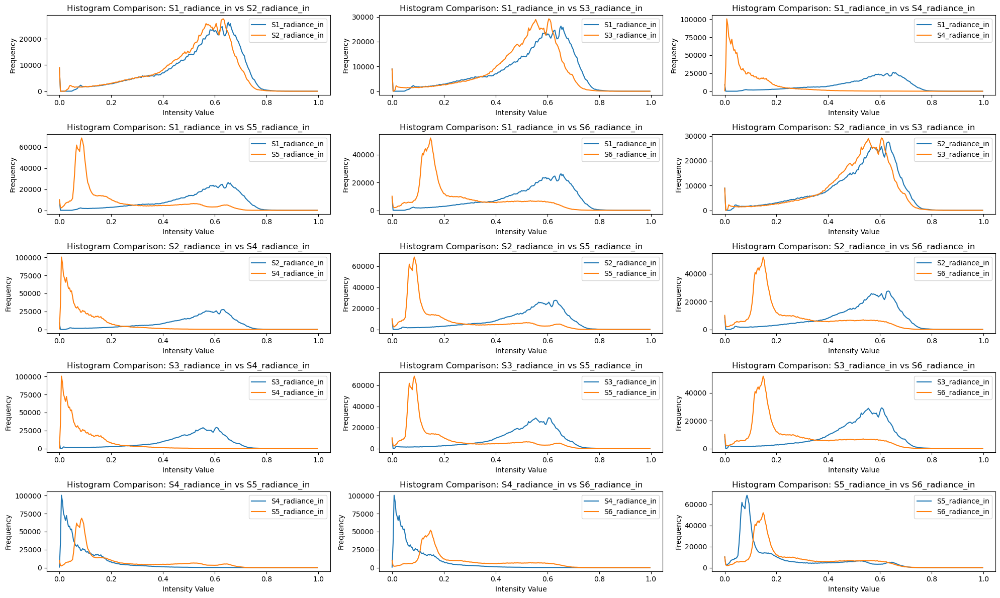

In [45]:
# Number of comparisons
num_comparisons = (num_layers * (num_layers - 1)) // 2

# Calculate the number of rows and columns for the subplots
num_cols = 3
num_rows = (num_comparisons + num_cols - 1) // num_cols

# Create a figure with subplots for histograms
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 12))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot each histogram comparison in a separate subplot
comparison_index = 0
for i in range(num_layers - 1):
    for j in range(i + 1, num_layers):
        ax = axes[comparison_index]
        hist1, bins1 = np.histogram(all_features[:, :, i].flatten(), bins=256, range=(0, 1))
        hist2, bins2 = np.histogram(all_features[:, :, j].flatten(), bins=256, range=(0, 1))
        
        ax.plot(bins1[:-1], hist1, label=f'{radiance_layers[i]}')
        ax.plot(bins2[:-1], hist2, label=f'{radiance_layers[j]}')
        ax.legend()
        ax.set_title(f'Histogram Comparison: {radiance_layers[i]} vs {radiance_layers[j]}')
        ax.set_xlabel('Intensity Value')
        ax.set_ylabel('Frequency')
        comparison_index += 1

# Hide any empty subplots
for idx in range(comparison_index, len(axes)):
    fig.delaxes(axes[idx])

plt.tight_layout()
plt.show()


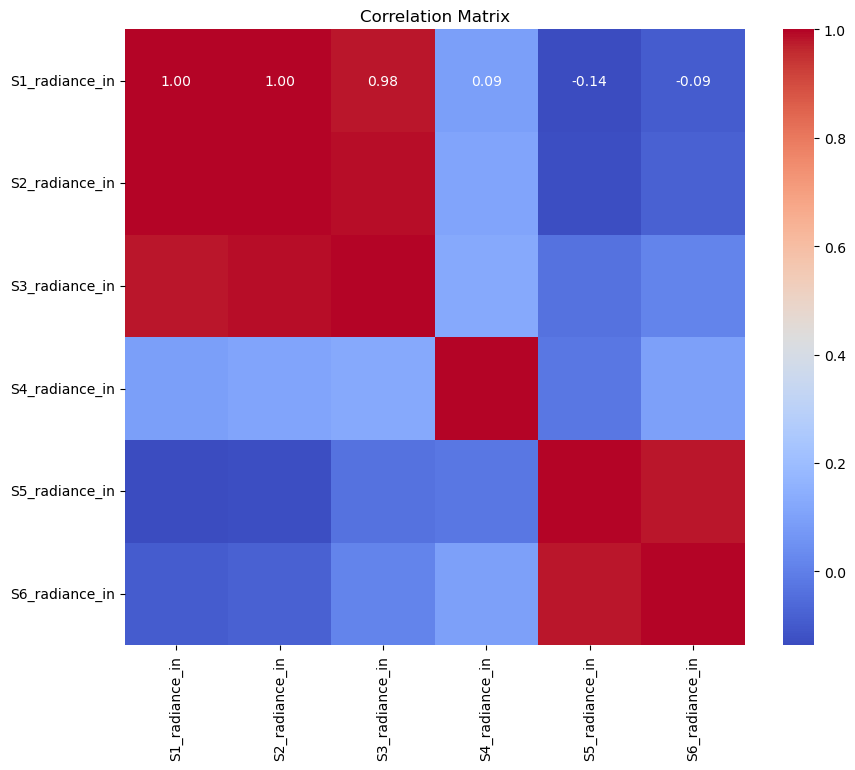

In [50]:
import seaborn as sns
import pandas as pd

# Flatten all features and create a DataFrame
flattened_features = [all_features[:, :, i].flatten() for i in range(num_layers)]
df = pd.DataFrame(flattened_features, index=radiance_layers).transpose()

# Calculate the correlation matrix
corr_matrix = df.corr()

# Plot the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()



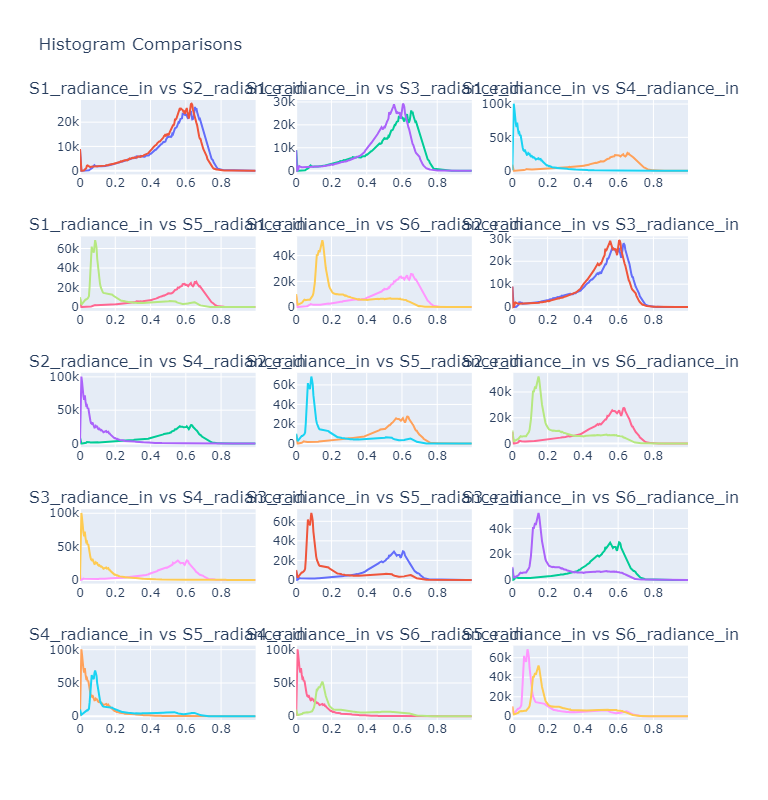

In [51]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Number of comparisons
num_comparisons = (num_layers * (num_layers - 1)) // 2

# Calculate the number of rows and columns for the subplots
num_cols = 3
num_rows = (num_comparisons + num_cols - 1) // num_cols

# Create subplots for histograms
fig = make_subplots(rows=num_rows, cols=num_cols, subplot_titles=[f'{radiance_layers[i]} vs {radiance_layers[j]}' for i in range(num_layers - 1) for j in range(i + 1, num_layers)])

comparison_index = 0
for i in range(num_layers - 1):
    for j in range(i + 1, num_layers):
        hist1, bins1 = np.histogram(all_features[:, :, i].flatten(), bins=256, range=(0, 1))
        hist2, bins2 = np.histogram(all_features[:, :, j].flatten(), bins=256, range=(0, 1))
        
        fig.add_trace(go.Scatter(x=bins1[:-1], y=hist1, mode='lines', name=f'{radiance_layers[i]}'),
                      row=comparison_index // num_cols + 1, col=comparison_index % num_cols + 1)
        fig.add_trace(go.Scatter(x=bins2[:-1], y=hist2, mode='lines', name=f'{radiance_layers[j]}'),
                      row=comparison_index // num_cols + 1, col=comparison_index % num_cols + 1)
        comparison_index += 1

fig.update_layout(height=800, width=1200, title_text="Histogram Comparisons", showlegend=False)
fig.show()
